<a href="https://colab.research.google.com/github/BA-Etchepareborda/Pytorch_Learning/blob/main/RL/RL_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 43.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [17]:
import gym
import numpy as np
import matplotlib.pyplot as plt

class LidarEnv(gym.Env):
    def __init__(self):
        super(LidarEnv, self).__init__()
        self.action_space = gym.spaces.Discrete(3)  # 0: izquierda, 1: derecha, 2: adelante
        self.observation_space = gym.spaces.Box(low=0, high=10, shape=(180,), dtype=np.float32)  # 180 rangos de distancia (metros)

    def reset(self):
        # Inicializa con obstáculos aleatorios (simulación simplificada)
        self.state = np.random.uniform(0, 10, 180)  # Distancias aleatorias (0m a 10m)
        return self.state

    def step(self, action):
        # Mueve el robot y actualiza el LIDAR
        if action == 0:  # Izquierda
            self.state = np.roll(self.state, -10)  # Simula giro
        elif action == 1:  # Derecha
            self.state = np.roll(self.state, 10)
        else:  # Adelante
            self.state = np.clip(self.state - 0.5, 0, 10)  # Reduce distancias (como si avanzara)

        # Recompensa y condición de terminación
        min_distance = np.min(self.state)
        reward = min_distance  # Premio por mantener distancia
        done = (min_distance < 0.5)  # Choca si está a menos de 0.5m
        return self.state, reward, done, {}

    def render(self):
        # Visualización del LIDAR (ángulos vs. distancias)
        plt.figure(figsize=(10, 4))
        plt.bar(range(180), self.state)
        plt.xlabel("Ángulo (grados)")
        plt.ylabel("Distancia (m)")
        plt.title("Lectura del LIDAR")
        plt.show()

env = LidarEnv()

In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random

class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, output_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# Hiperparámetros
gamma = 0.99
epsilon = 0.2
batch_size = 64
memory = deque(maxlen=10000)

dqn = DQN(180, 3).cuda() if torch.cuda.is_available() else DQN(180, 3)
optimizer = optim.Adam(dqn.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

Episodio 0, Recompensa: 0.00


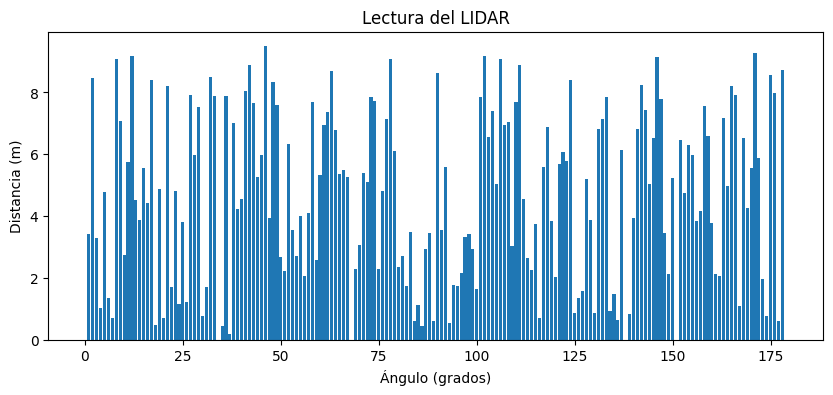

Episodio 50, Recompensa: 0.02


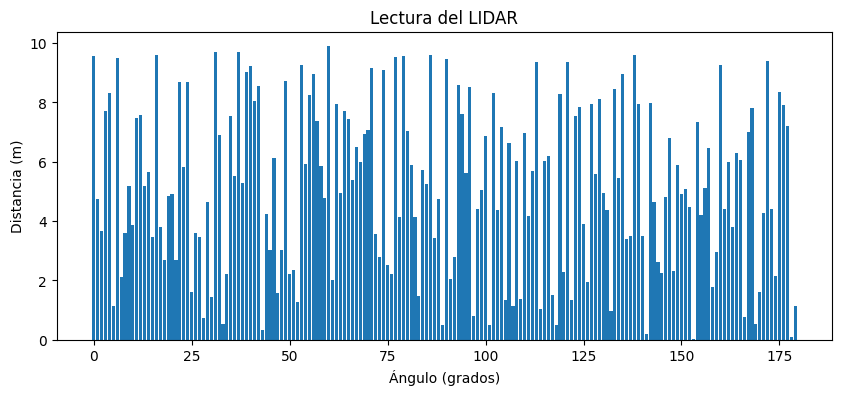

/tmp/ipython-input-14-1104480805.py:29: DeprecationWarning: In future, it will be an error for 'np.bool' scalars to be interpreted as an index
  dones = torch.FloatTensor(dones).cuda()


Episodio 100, Recompensa: 0.01


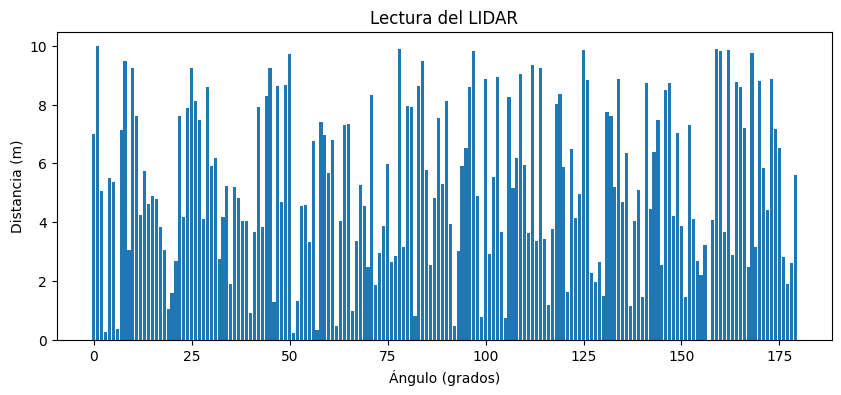

Episodio 150, Recompensa: 0.15


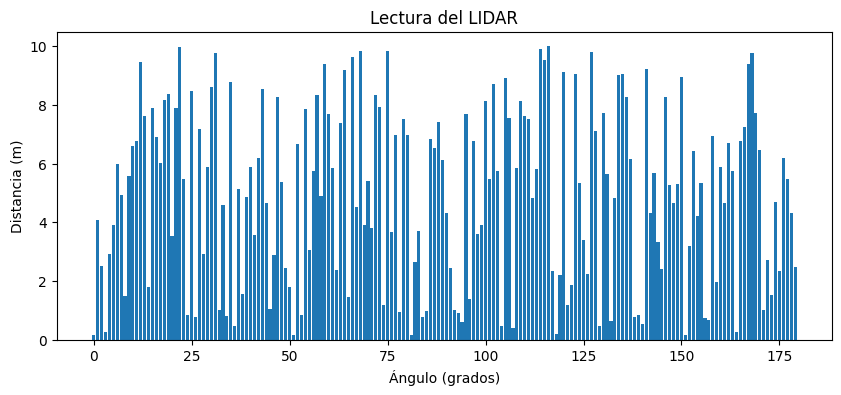

Episodio 200, Recompensa: 0.04


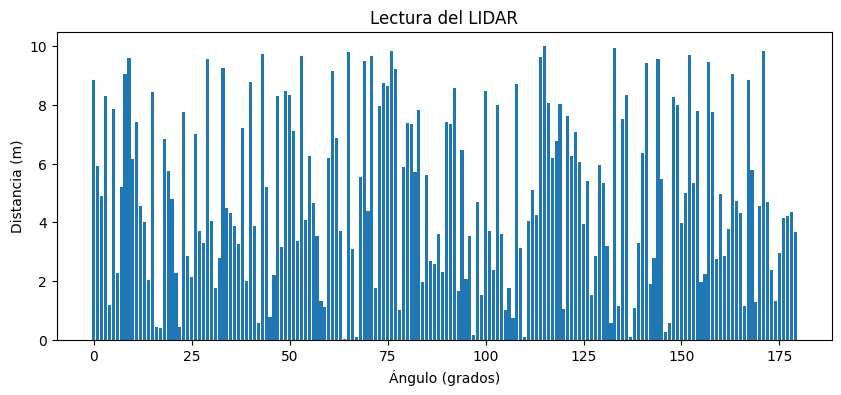

Episodio 250, Recompensa: 0.03


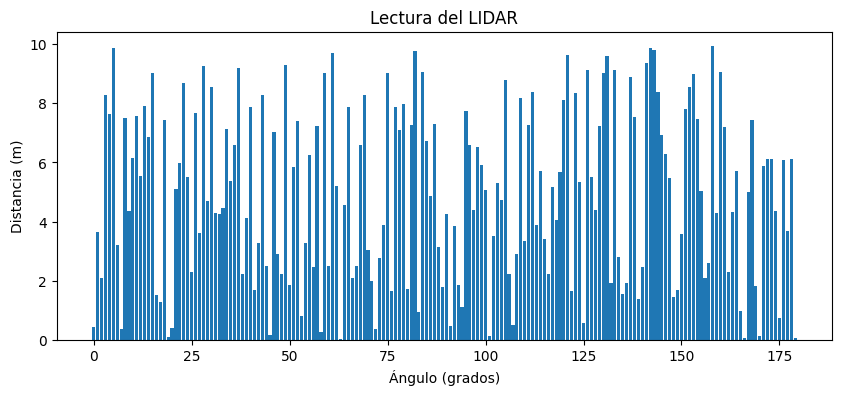

Episodio 300, Recompensa: 0.00


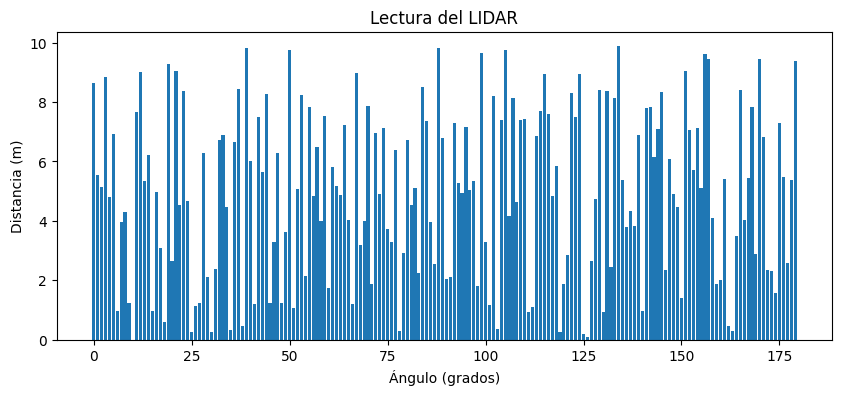

Episodio 350, Recompensa: 0.09


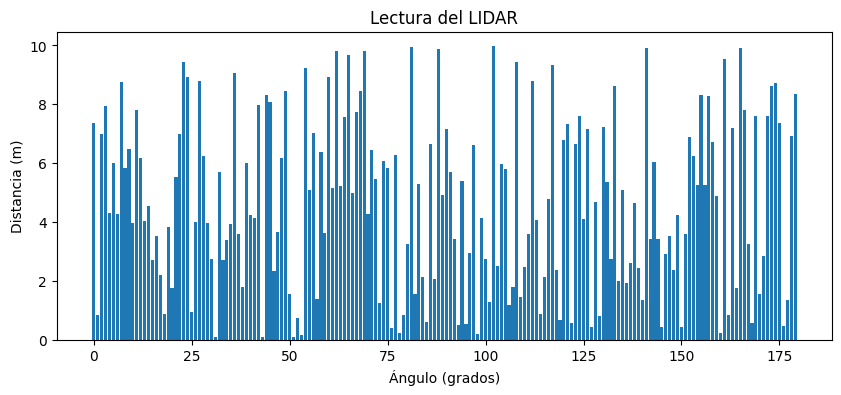

Episodio 400, Recompensa: 0.00


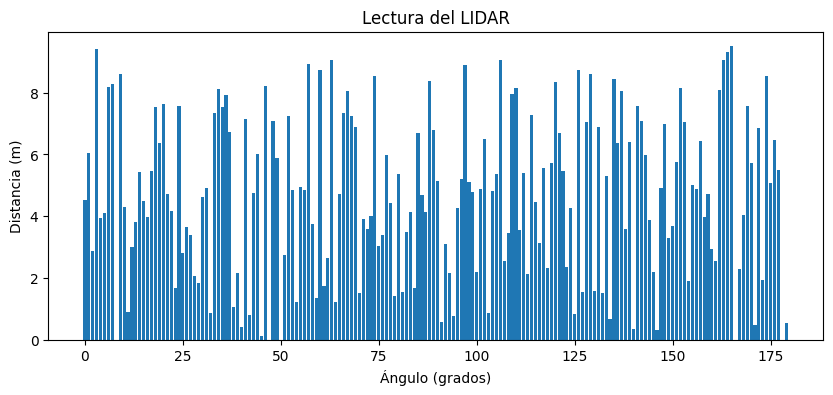

Episodio 450, Recompensa: 0.03


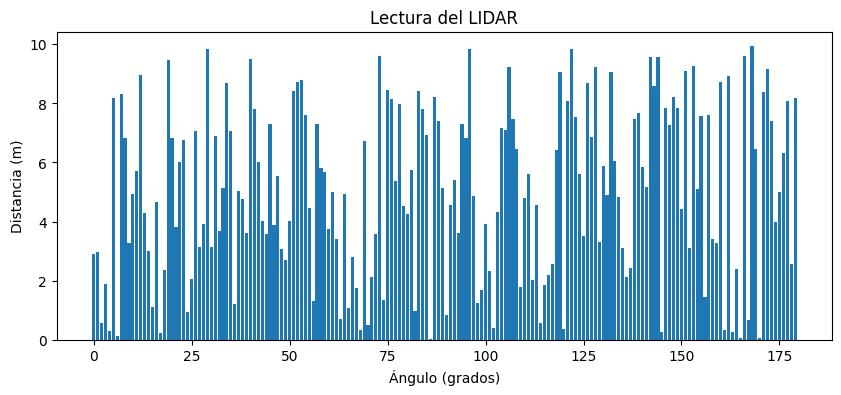

Episodio 500, Recompensa: 0.06


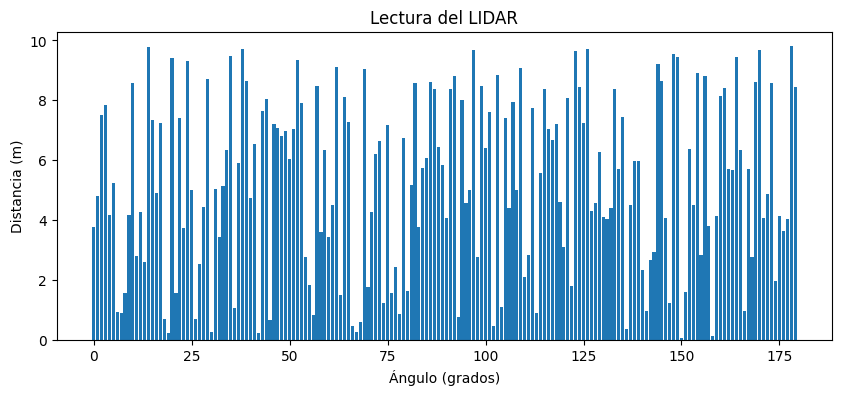

Episodio 550, Recompensa: 0.15


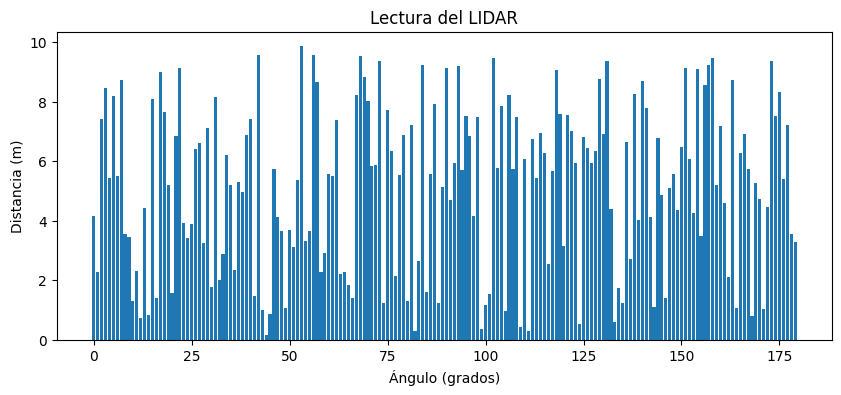

Episodio 600, Recompensa: 0.00


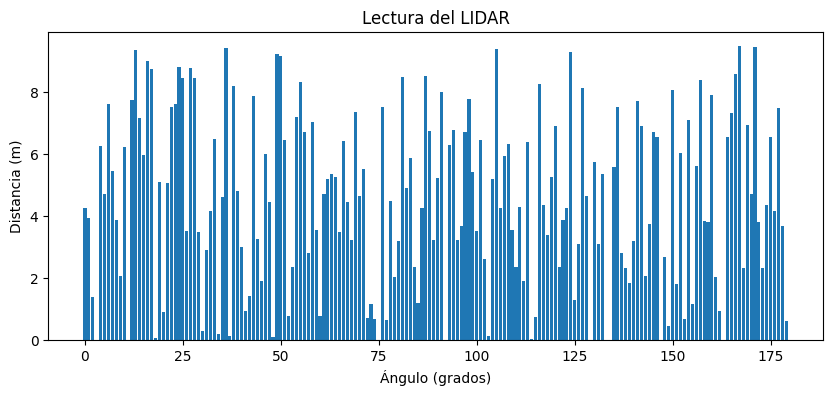

Episodio 650, Recompensa: 0.04


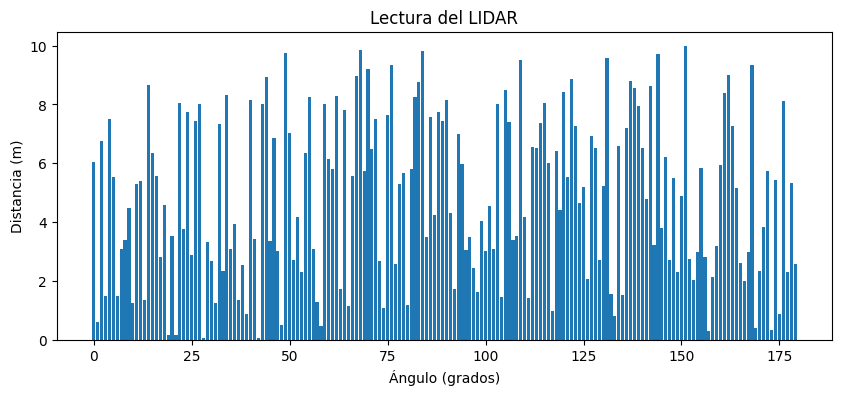

Episodio 700, Recompensa: 0.00


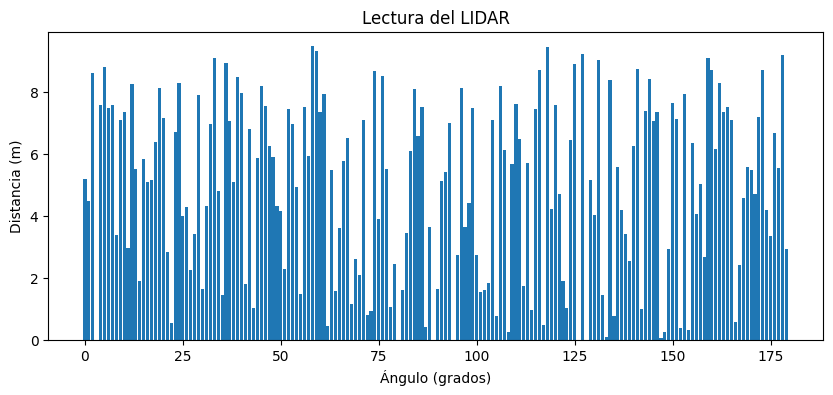

Episodio 750, Recompensa: 0.10


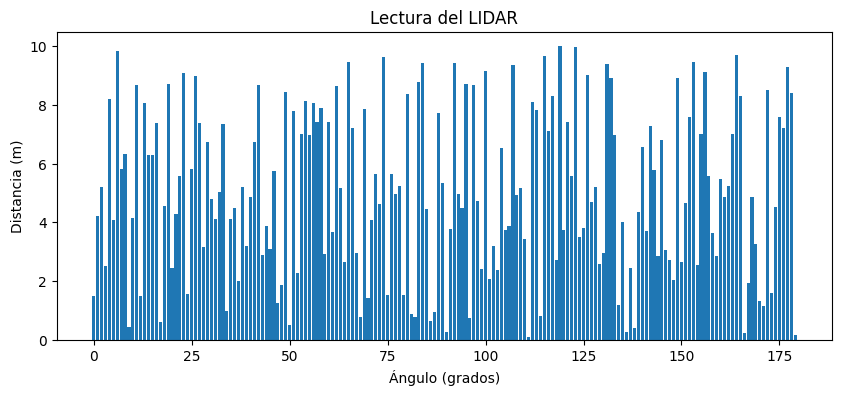

Episodio 800, Recompensa: 0.00


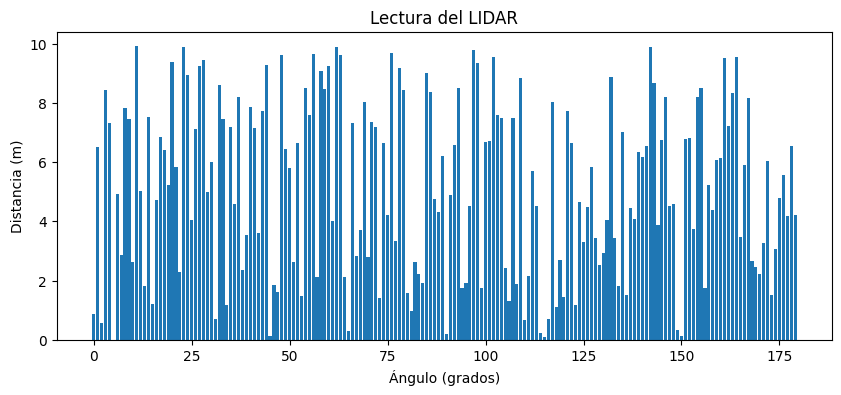

Episodio 850, Recompensa: 0.09


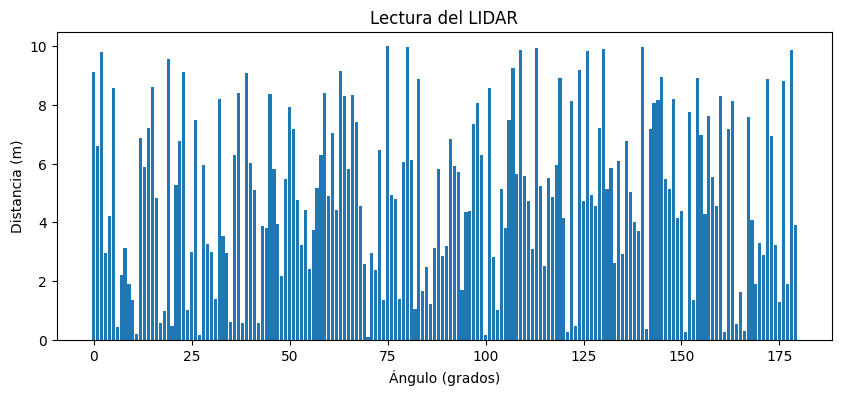

Episodio 900, Recompensa: 0.03


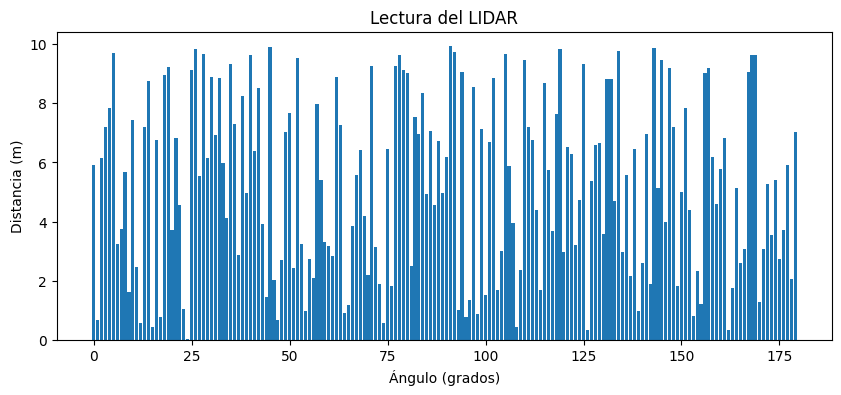

Episodio 950, Recompensa: 0.00


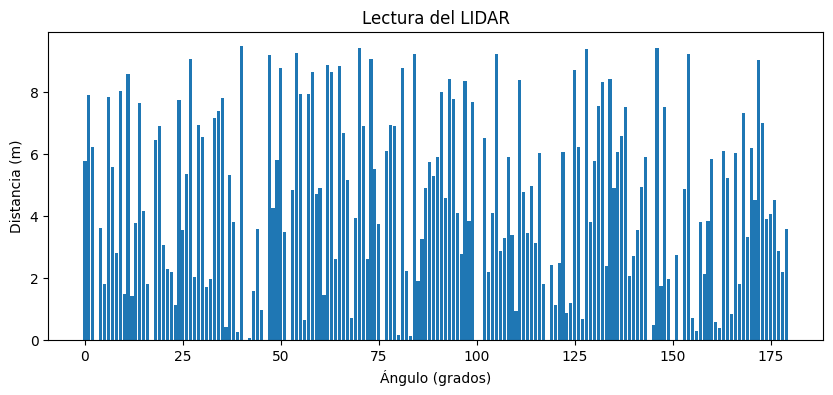

Episodio 1000, Recompensa: 0.03


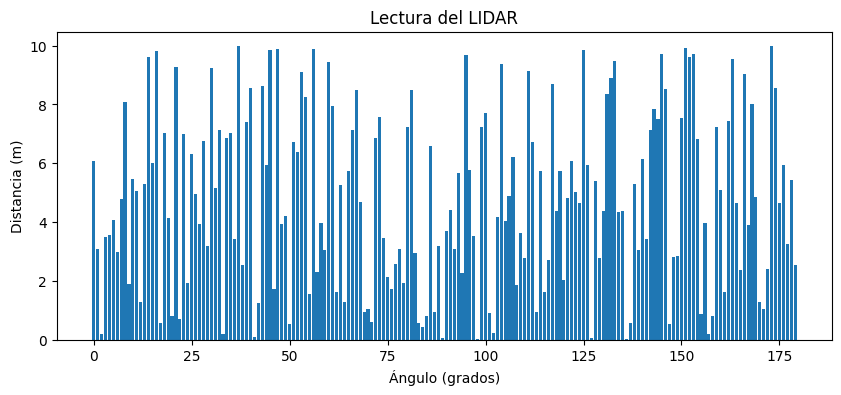

Episodio 1050, Recompensa: 0.05


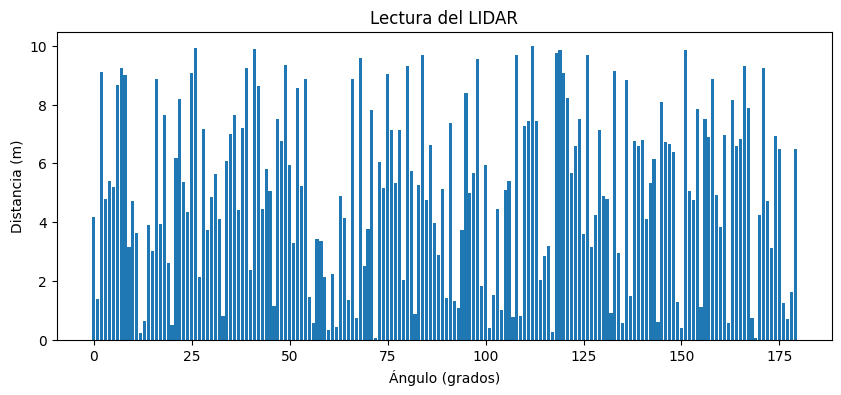

Episodio 1100, Recompensa: 0.00


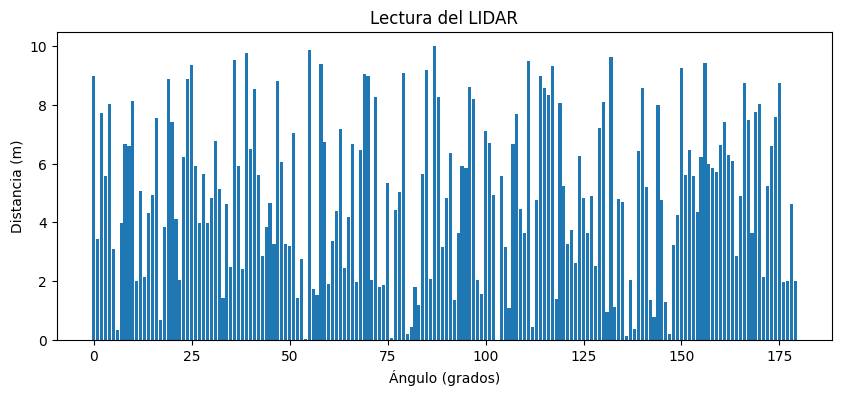

Episodio 1150, Recompensa: 0.04


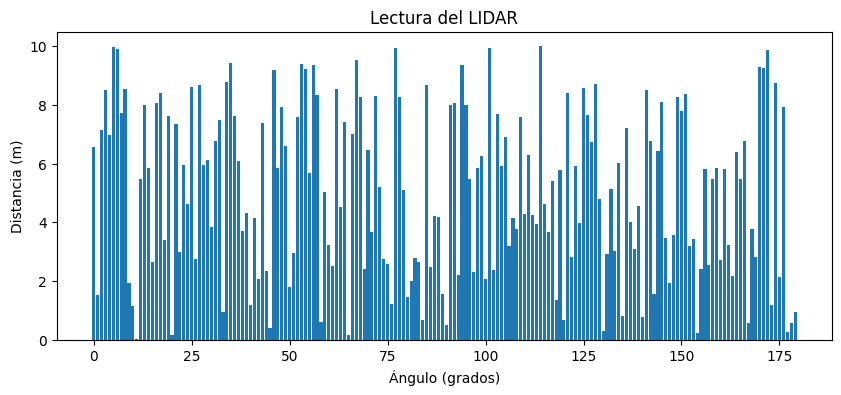

Episodio 1200, Recompensa: 0.09


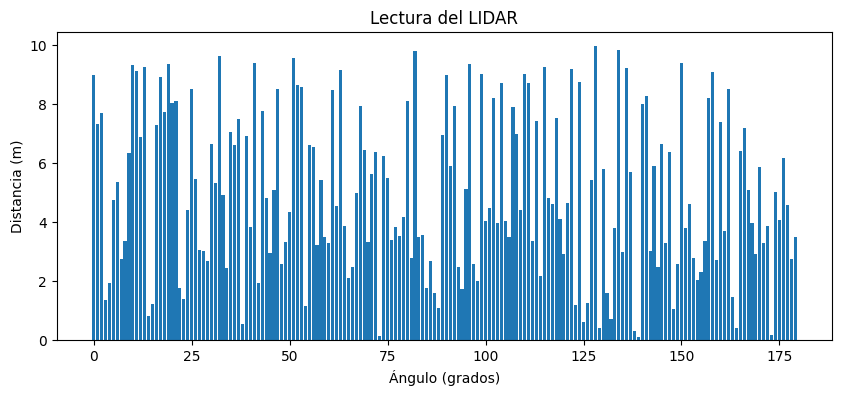

Episodio 1250, Recompensa: 0.06


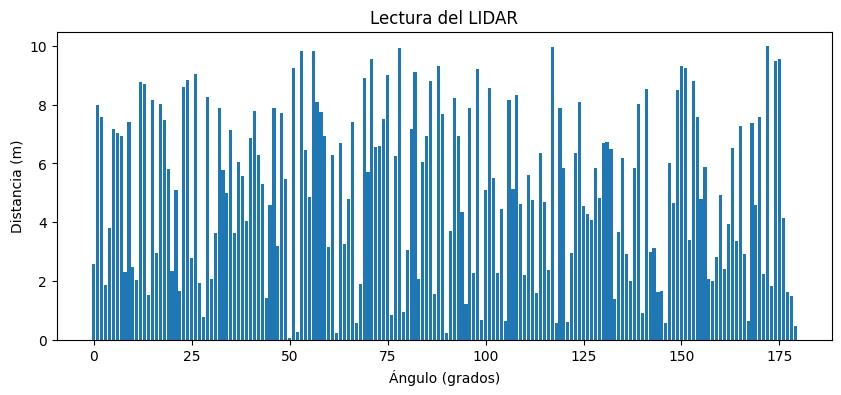

Episodio 1300, Recompensa: 0.11


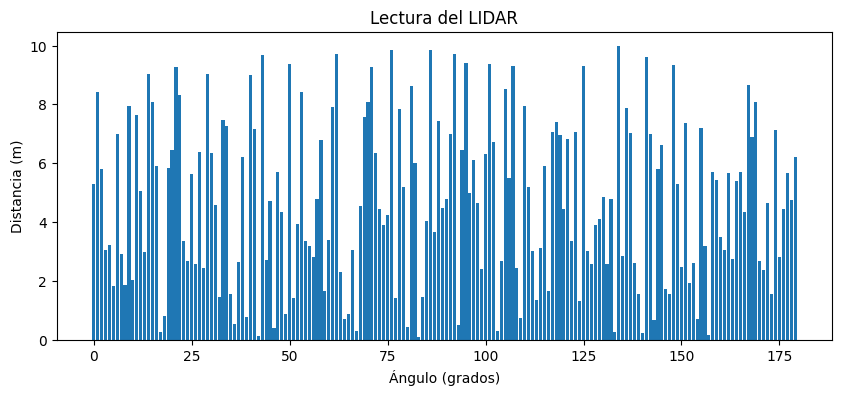

Episodio 1350, Recompensa: 0.00


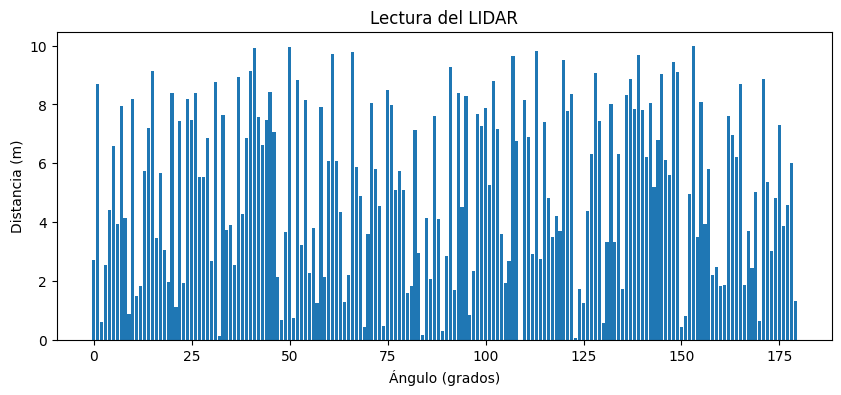

Episodio 1400, Recompensa: 0.09


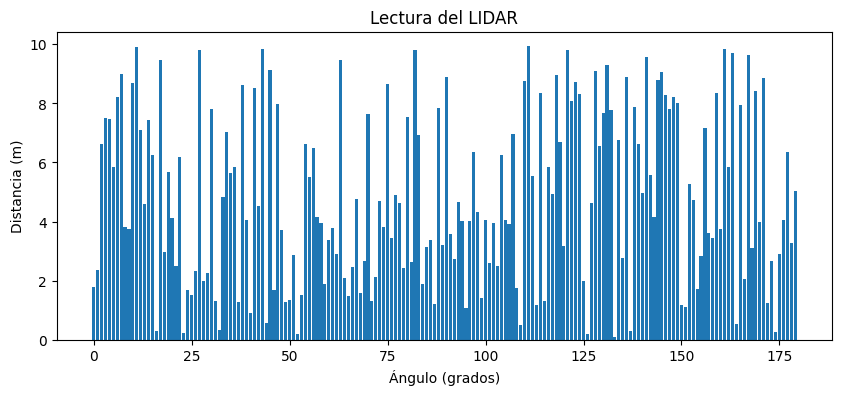

Episodio 1450, Recompensa: 0.00


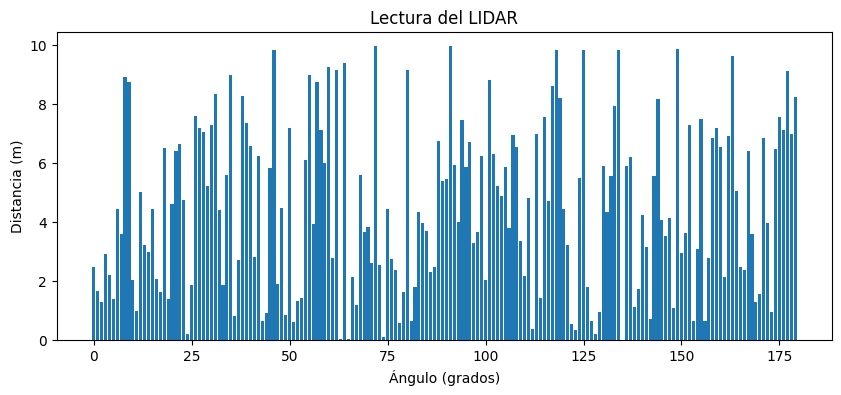

Episodio 1500, Recompensa: 0.01


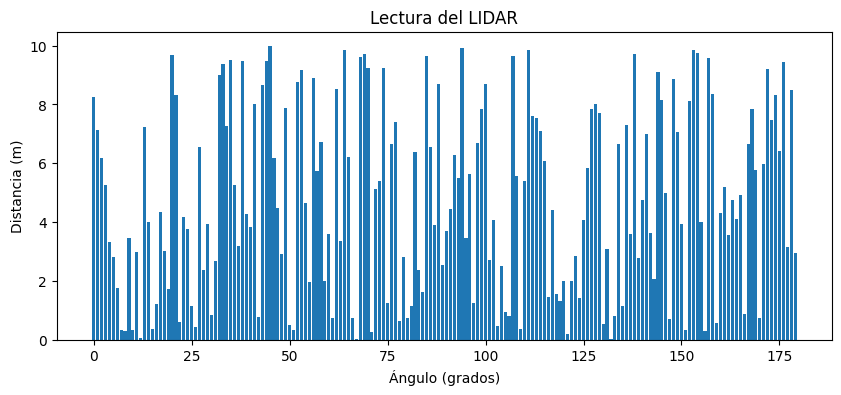

Episodio 1550, Recompensa: 0.04


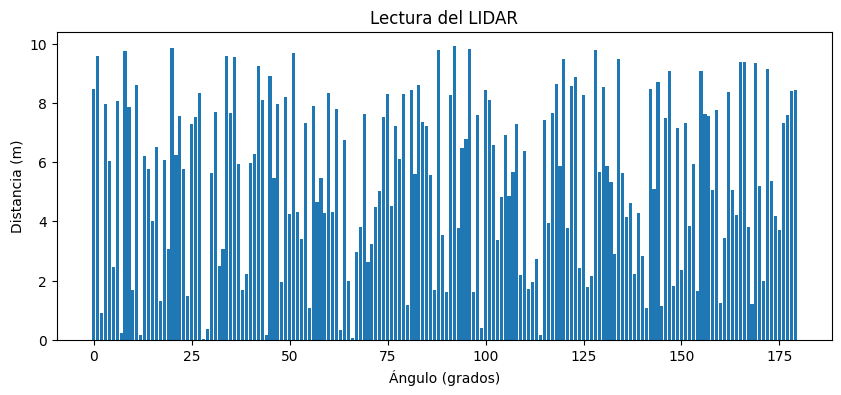

Episodio 1600, Recompensa: 0.02


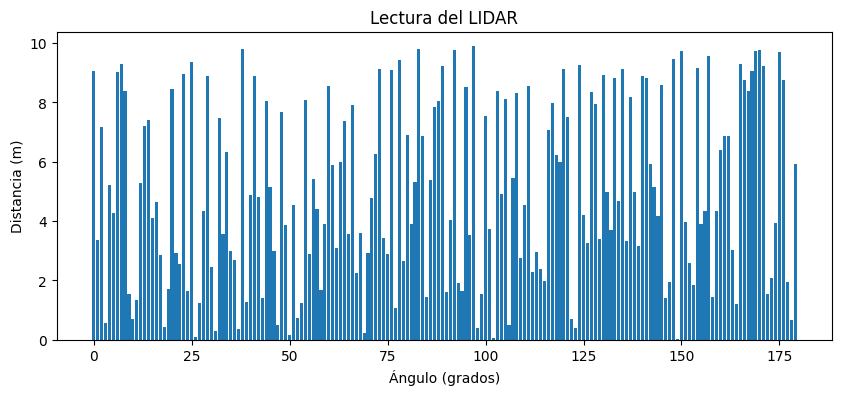

Episodio 1650, Recompensa: 0.08


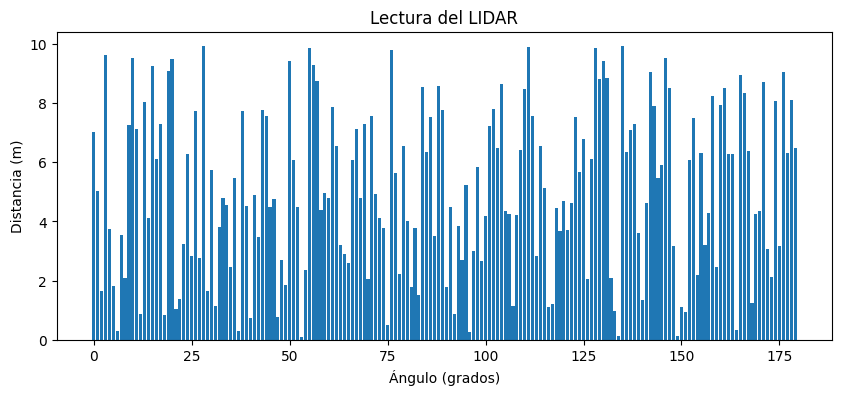

Episodio 1700, Recompensa: 0.00


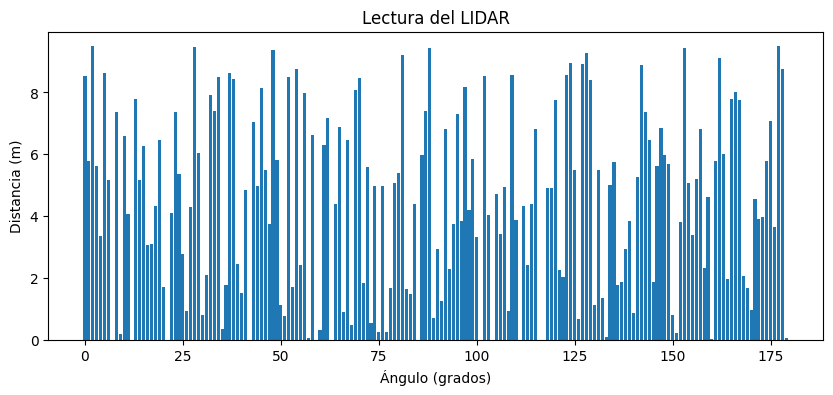

Episodio 1750, Recompensa: 0.00


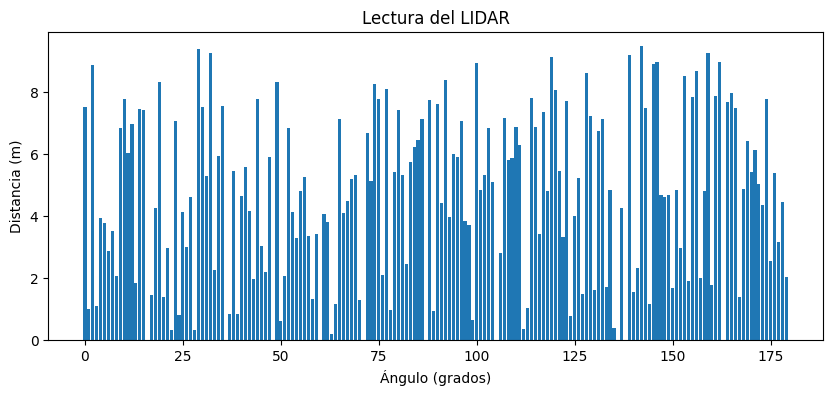

Episodio 1800, Recompensa: 0.01


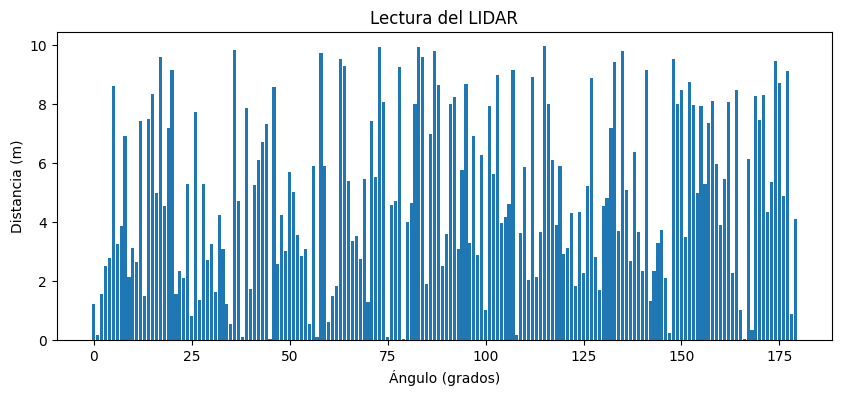

Episodio 1850, Recompensa: 0.01


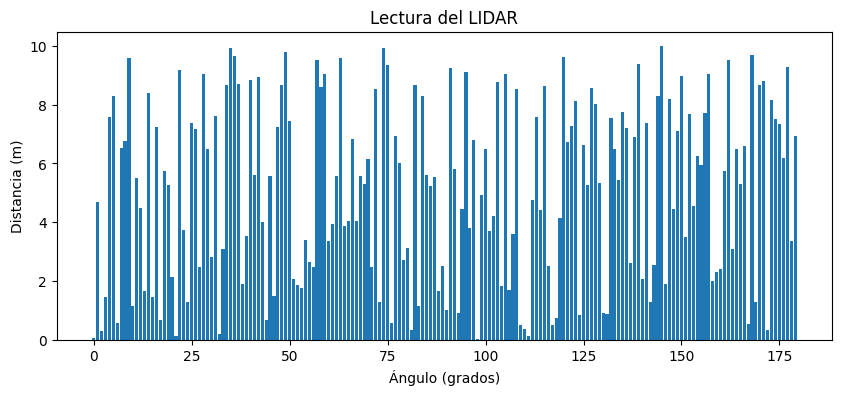

Episodio 1900, Recompensa: 0.00


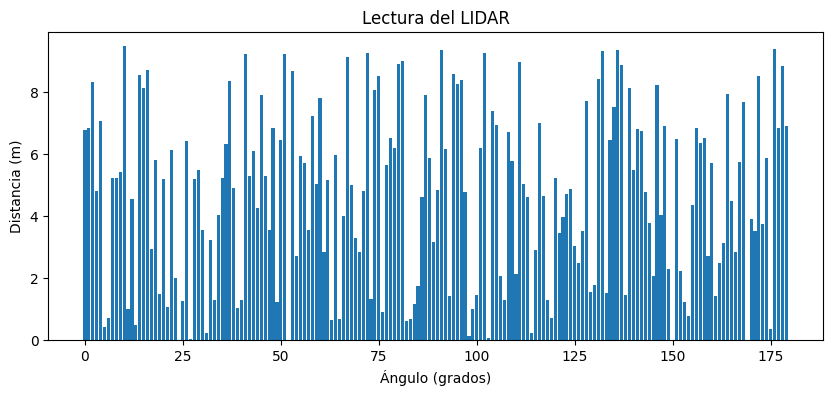

Episodio 1950, Recompensa: 0.04


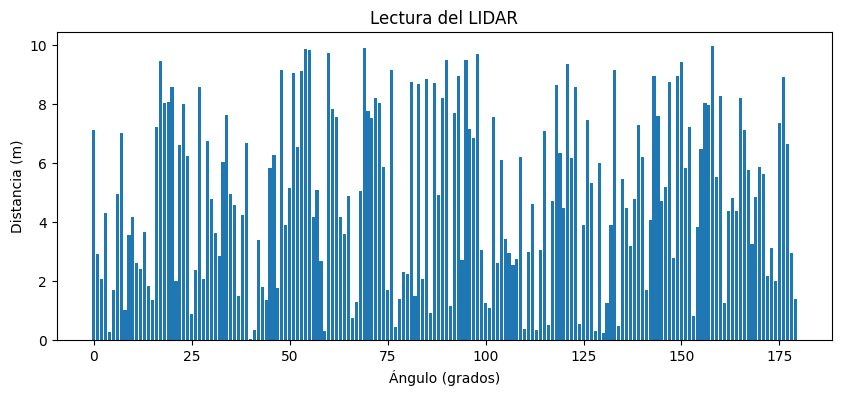

Episodio 2000, Recompensa: 0.01


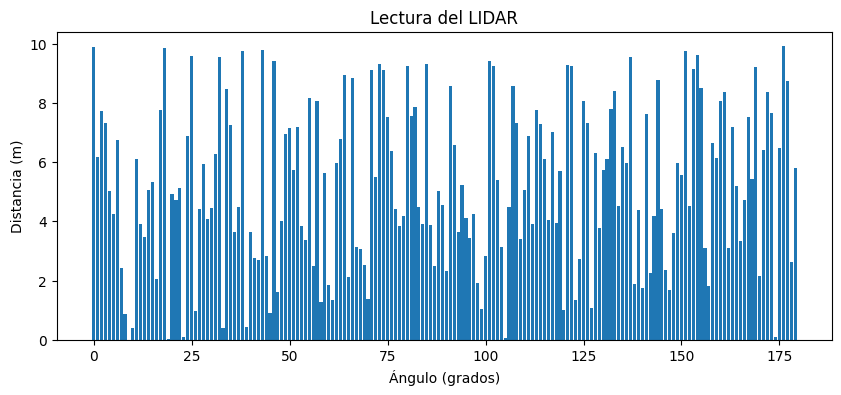

Episodio 2050, Recompensa: 0.00


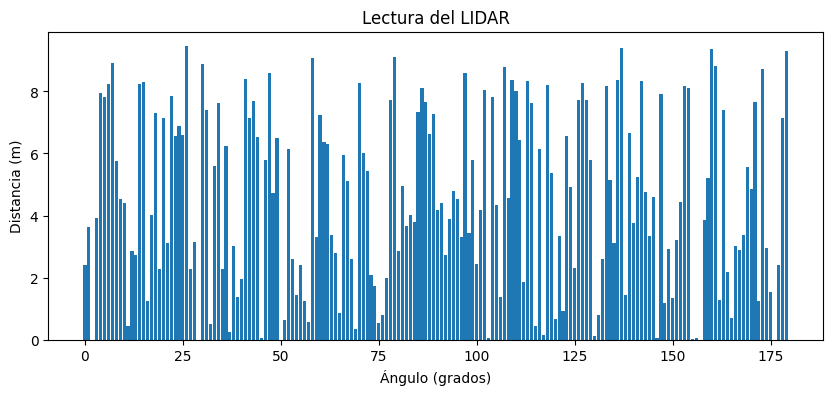

Episodio 2100, Recompensa: 0.01


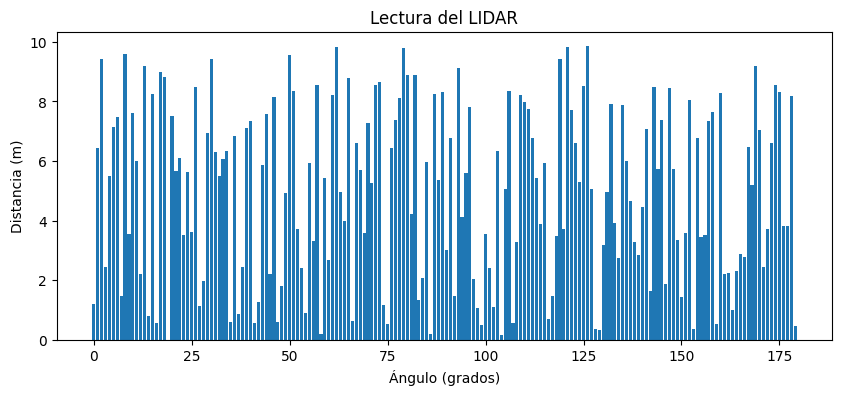

Episodio 2150, Recompensa: 0.06


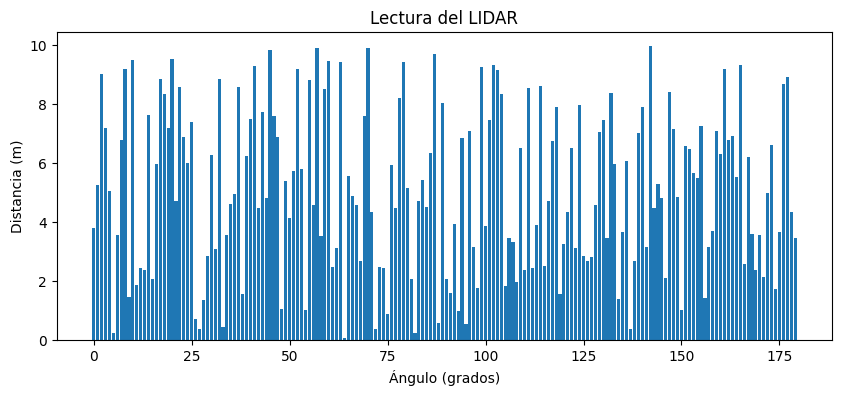

Episodio 2200, Recompensa: 0.17


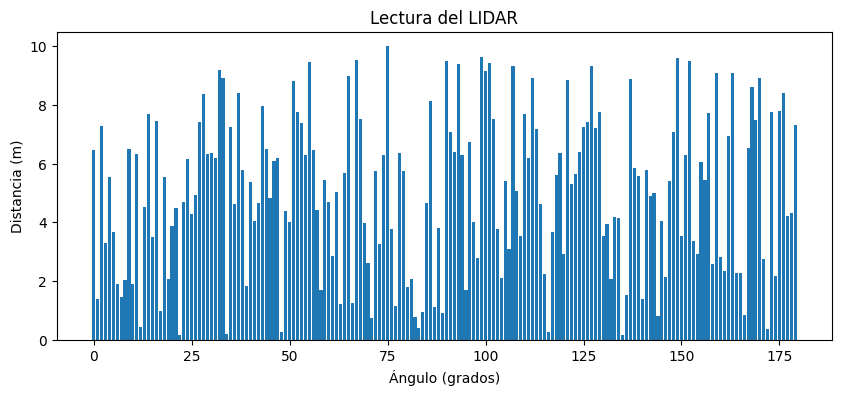

Episodio 2250, Recompensa: 0.00


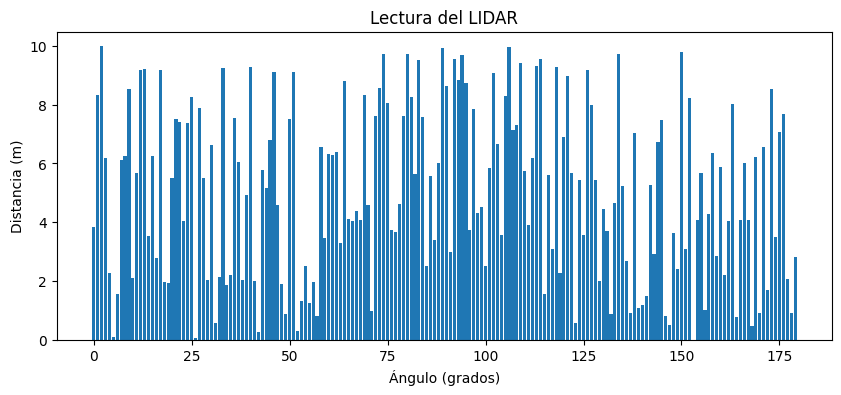

Episodio 2300, Recompensa: 0.12


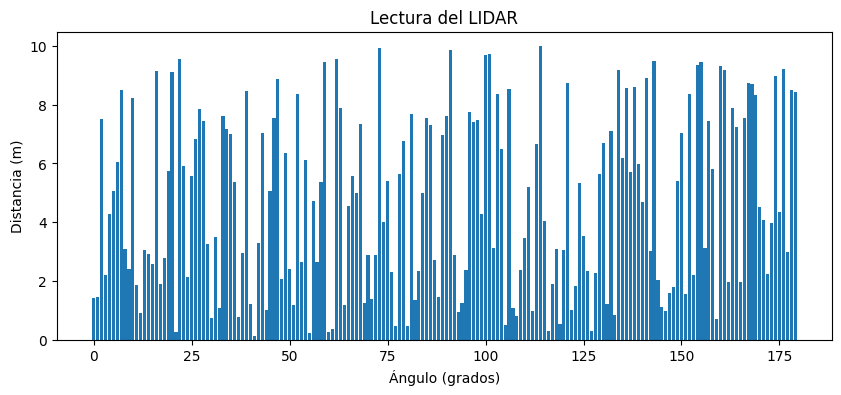

Episodio 2350, Recompensa: 0.05


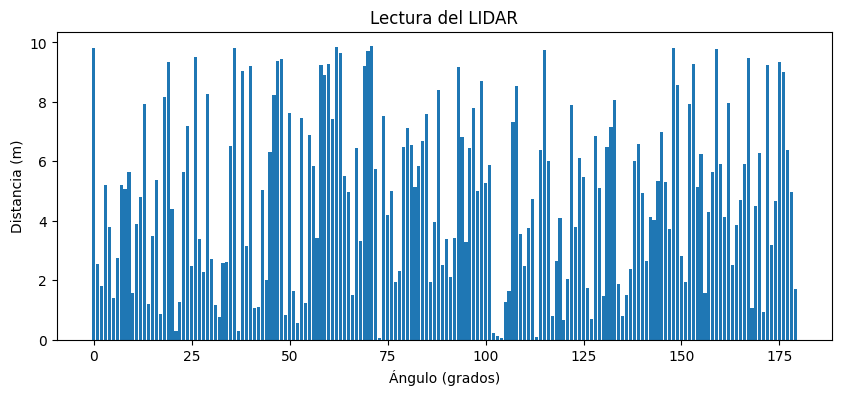

Episodio 2400, Recompensa: 0.01


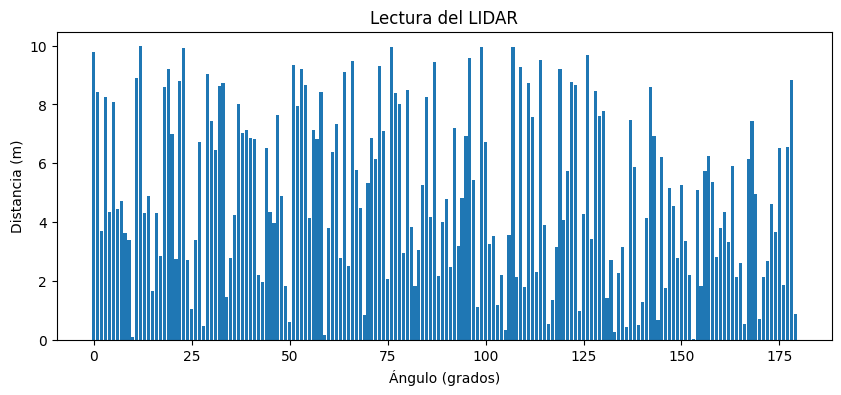

Episodio 2450, Recompensa: 0.00


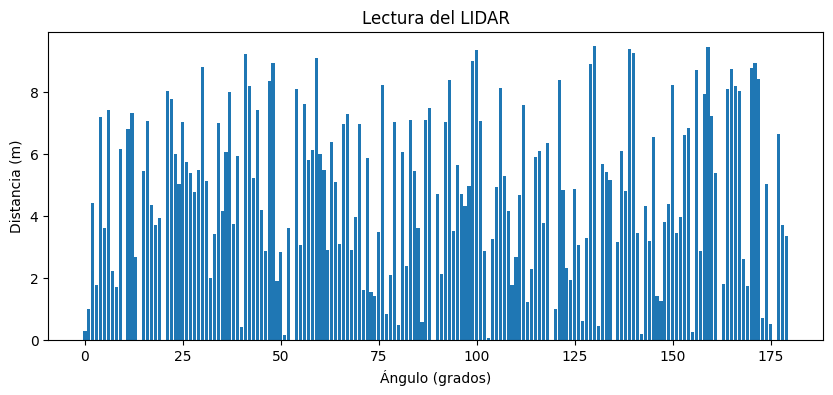

Episodio 2500, Recompensa: 0.17


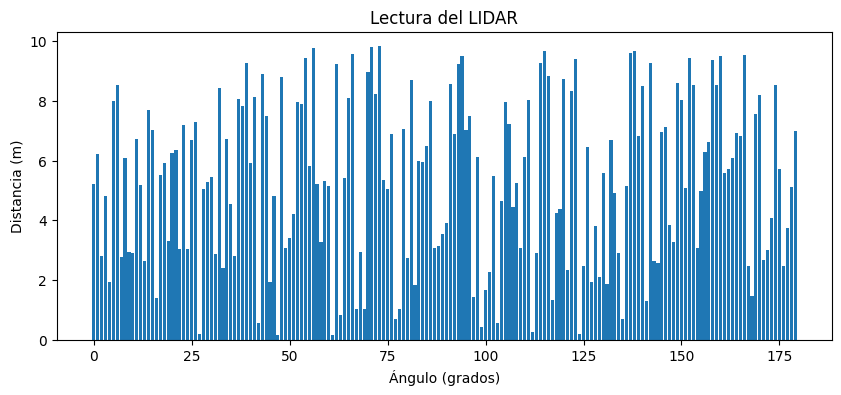

Episodio 2550, Recompensa: 0.19


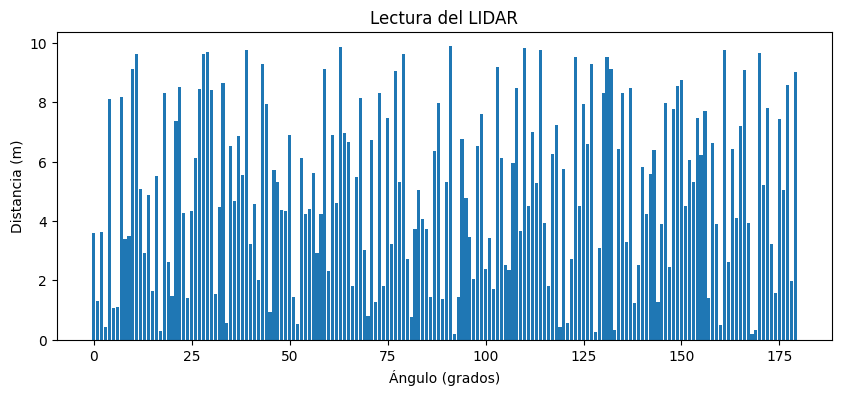

Episodio 2600, Recompensa: 0.04


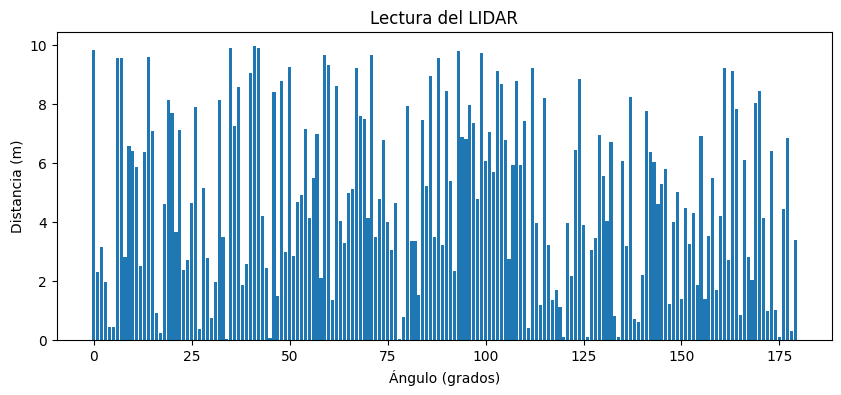

Episodio 2650, Recompensa: 0.00


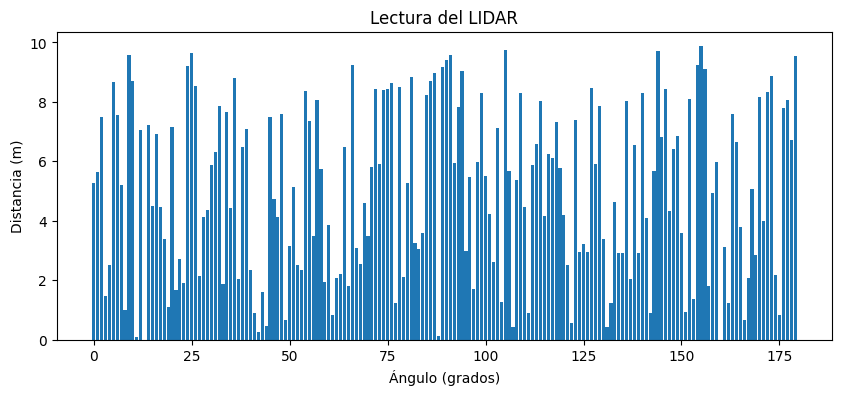

Episodio 2700, Recompensa: 0.00


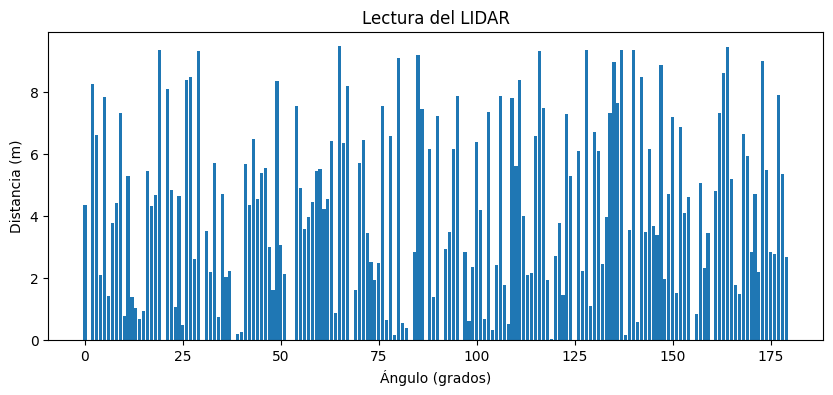

Episodio 2750, Recompensa: 0.01


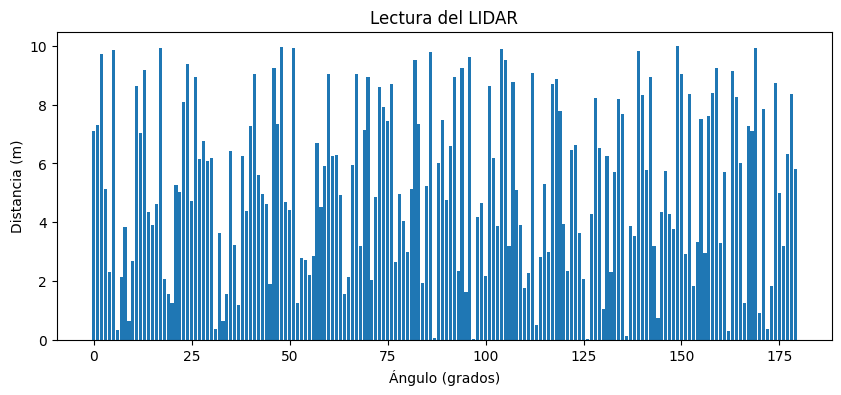

Episodio 2800, Recompensa: 0.02


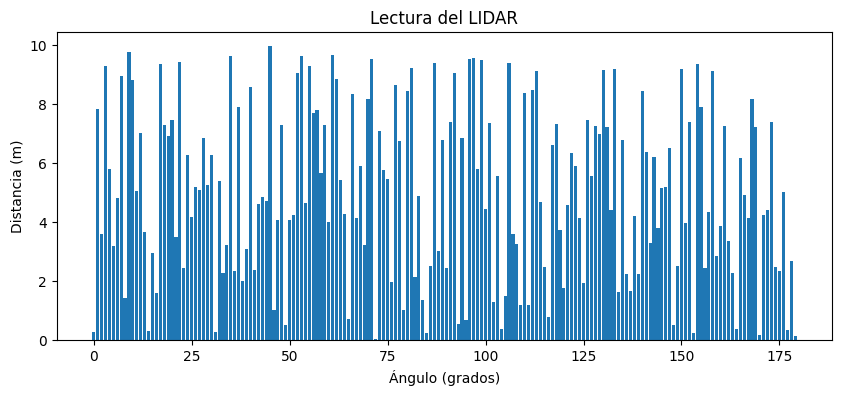

Episodio 2850, Recompensa: 0.01


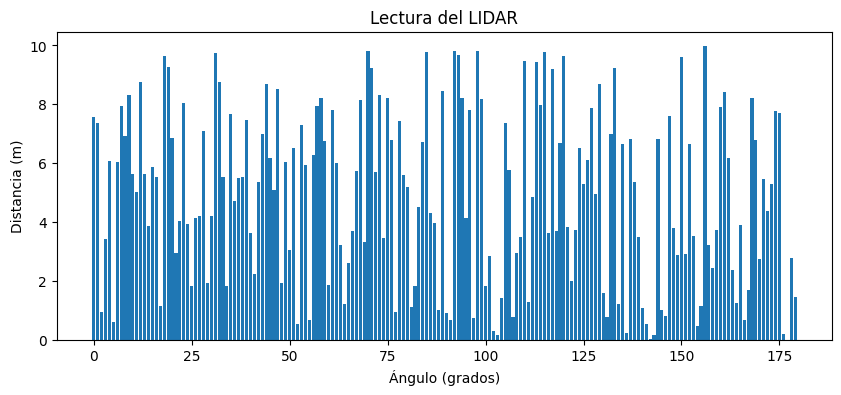

Episodio 2900, Recompensa: 0.12


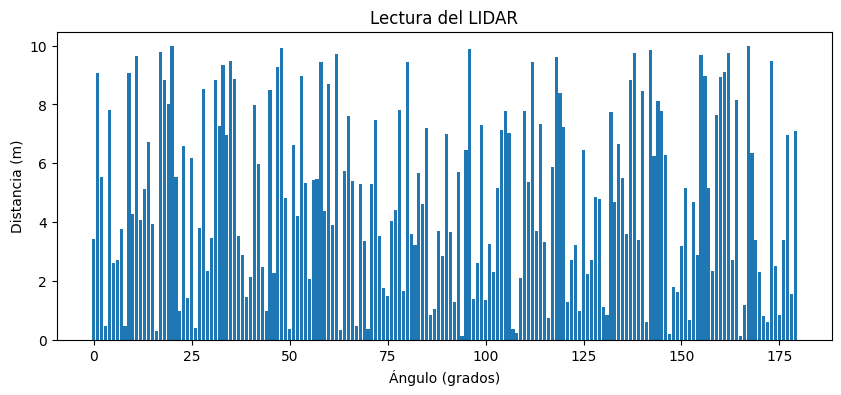

Episodio 2950, Recompensa: 0.04


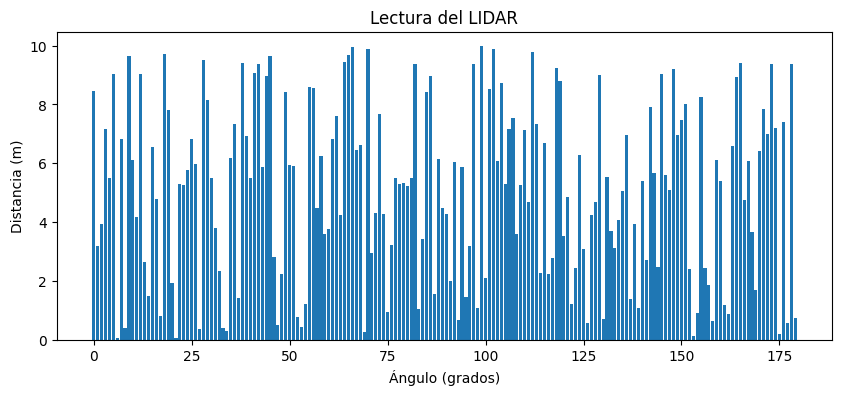

In [14]:
rewards_history = []

for episode in range(3000):
    state = env.reset()
    total_reward = 0

    while True:
        # Selección de acción (epsilon-greedy)
        if np.random.rand() < epsilon:
            action = env.action_space.sample()
        else:
            with torch.no_grad():
                q_values = dqn(torch.FloatTensor(state).unsqueeze(0).cuda())
                action = torch.argmax(q_values).item()

        next_state, reward, done, _ = env.step(action)
        memory.append((state, action, reward, next_state, done))
        total_reward += reward

        # Optimización
        if len(memory) > batch_size:
            batch = random.sample(memory, batch_size)
            states, actions, rewards, next_states, dones = zip(*batch)

            states = torch.FloatTensor(states).cuda()
            next_states = torch.FloatTensor(next_states).cuda()
            actions = torch.LongTensor(actions).cuda()
            rewards = torch.FloatTensor(rewards).cuda()
            dones = torch.FloatTensor(dones).cuda()

            current_q = dqn(states).gather(1, actions.unsqueeze(1))
            next_q = dqn(next_states).max(1)[0].detach()
            target_q = rewards + (1 - dones) * gamma * next_q

            loss = loss_fn(current_q.squeeze(), target_q)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        state = next_state
        if done:
            rewards_history.append(total_reward)
            if episode % 50 == 0:
                print(f"Episodio {episode}, Recompensa: {total_reward:.2f}")
                #env.render()  # Visualizar LIDAR
            break

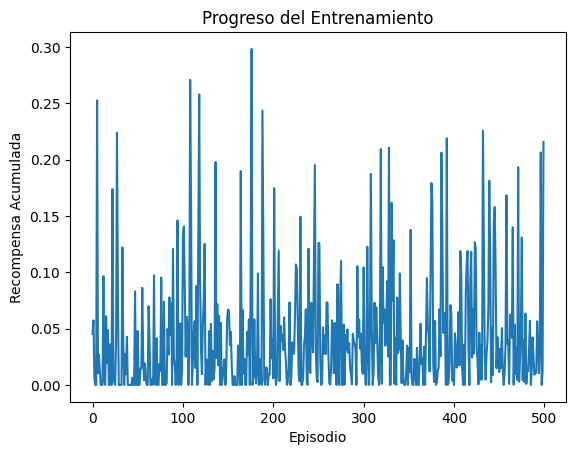

In [5]:
plt.plot(rewards_history)
plt.xlabel("Episodio")
plt.ylabel("Recompensa Acumulada")
plt.title("Progreso del Entrenamiento")
plt.show()

In [15]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

# Configuración inicial del entorno
env = LidarEnv()
state = env.reset()
agent = dqn.eval()  # Modo evaluación (sin exploración epsilon)

# Configurar figura para la animación
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(0, 180)
ax.set_ylim(0, 10)
ax.set_xlabel("Ángulo del LIDAR (grados)")
ax.set_ylabel("Distancia (m)")
title = ax.set_title("Simulación de Evasión de Obstáculos - Episodio 0")

# Inicializar gráfico de barras (LIDAR) y texto de acción
lidar_bars = ax.bar(range(180), state, color='blue', alpha=0.6)
action_text = ax.text(10, 9, f"Acción: Ninguna", fontsize=12)

def update(frame):
    global state

    # Obtener acción del agente
    with torch.no_grad():
        q_values = agent(torch.FloatTensor(state).unsqueeze(0).cuda())
        action = torch.argmax(q_values).item()

    # Mapear acción a texto
    action_map = {0: "Izquierda", 1: "Derecha", 2: "Adelante"}

    # Actualizar estado y gráficos
    state, _, done, _ = env.step(action)
    for bar, h in zip(lidar_bars, state):
        bar.set_height(h)
    title.set_text(f"Simulación - Paso {frame}")
    action_text.set_text(f"Acción: {action_map[action]}")

    if done:
        state = env.reset()

    return lidar_bars, title, action_text

# Crear animación
ani = animation.FuncAnimation(
    fig, update, frames=100, interval=200, blit=False
)

# Mostrar en el notebook
plt.close()
HTML(ani.to_jshtml())

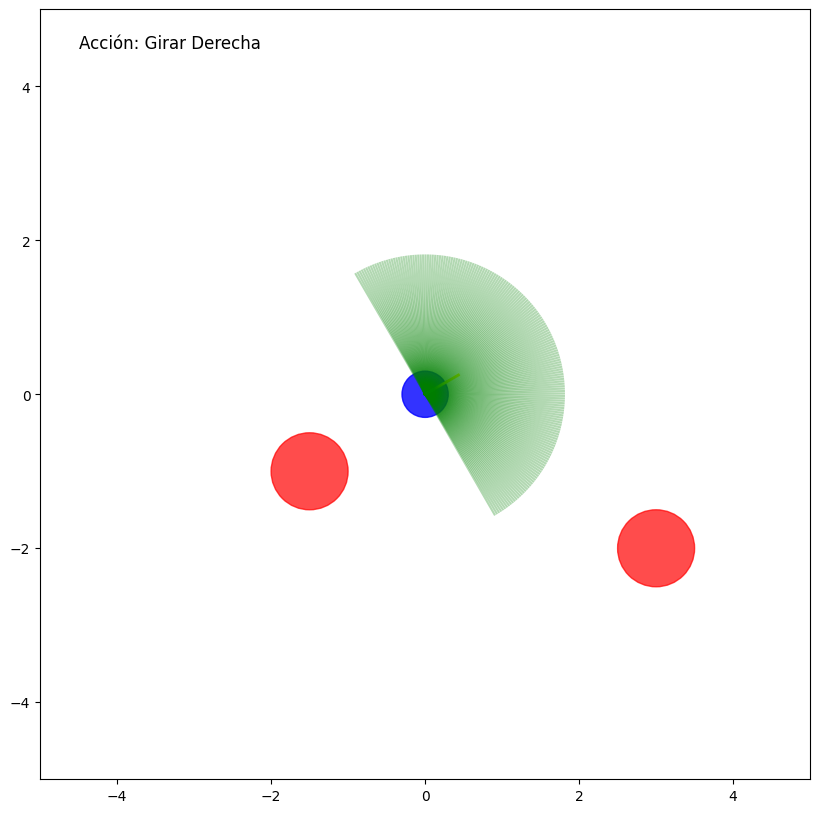

In [16]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Circle, Rectangle
from IPython.display import HTML

# 1. Clase de Simulación (igual que antes)
class SimulationEnv:
    def __init__(self):
        self.robot_pos = np.array([0.0, 0.0])
        self.robot_angle = 90
        self.obstacles = [
            np.array([-1.5, -1.0]),
            np.array([3.0, -2.0])
        ]

    def get_lidar_readings(self):
        angles = np.linspace(self.robot_angle - 90, self.robot_angle + 90, 180)
        distances = []
        for angle in angles:
            ray_end = self.robot_pos + 5 * np.array([np.cos(np.radians(angle)), np.sin(np.radians(angle))])
            dist = 5.0
            for obs in self.obstacles:
                d = np.linalg.norm(obs - self.robot_pos)
                if d < dist:
                    dist = d
            distances.append(dist)
        return np.array(distances)

    def step(self, action):
        if action == 0:
            self.robot_angle = (self.robot_angle + 15) % 360
        elif action == 1:
            self.robot_angle = (self.robot_angle - 15) % 360
        elif action == 2:
            dx = 0.3 * np.cos(np.radians(self.robot_angle))
            dy = 0.3 * np.sin(np.radians(self.robot_angle))
            self.robot_pos += np.array([dx, dy])
        return self.get_lidar_readings()

# 2. Inicializar entorno y modelo
env_sim = SimulationEnv()
dqn.eval()  # Poner el modelo en modo evaluación

# 3. Configuración de la figura
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
ax.set_aspect('equal')

# Dibujar obstáculos
for obs in env_sim.obstacles:
    ax.add_patch(Circle(obs, 0.5, color='red', alpha=0.7))

# Elementos dinámicos
robot = Circle(env_sim.robot_pos, 0.3, color='blue', alpha=0.8)
robot_front = plt.Line2D([0, 0], [0, 0], color='yellow', lw=2)
lidar_lines = [plt.Line2D([0, 0], [0, 0], color='green', alpha=0.3) for _ in range(180)]
action_text = ax.text(-4.5, 4.5, "", fontsize=12)

ax.add_patch(robot)
ax.add_line(robot_front)
for line in lidar_lines:
    ax.add_line(line)

# 4. Función de actualización con DQN
def update(frame):
    # Obtener estado actual (lecturas LIDAR)
    state = env_sim.get_lidar_readings()

    # Predecir acción con el DQN
    with torch.no_grad():
        state_tensor = torch.FloatTensor(state).unsqueeze(0).cuda()  # Mover a GPU si está disponible
        q_values = dqn(state_tensor)
        action = torch.argmax(q_values).item()

    # Mapear acción a texto
    action_map = {0: "Girar Izquierda", 1: "Girar Derecha", 2: "Avanzar"}
    action_text.set_text(f"Acción: {action_map[action]}")

    # Ejecutar acción en el entorno
    env_sim.step(action)

    # Actualizar gráficos
    robot.center = env_sim.robot_pos
    front_end = env_sim.robot_pos + 0.5 * np.array([np.cos(np.radians(env_sim.robot_angle)),
                                                  np.sin(np.radians(env_sim.robot_angle))])
    robot_front.set_data([env_sim.robot_pos[0], front_end[0]],
                        [env_sim.robot_pos[1], front_end[1]])

    angles = np.linspace(env_sim.robot_angle - 90, env_sim.robot_angle + 90, 180)
    for i, (angle, dist) in enumerate(zip(angles, state)):
        end_x = env_sim.robot_pos[0] + dist * np.cos(np.radians(angle))
        end_y = env_sim.robot_pos[1] + dist * np.sin(np.radians(angle))
        lidar_lines[i].set_data([env_sim.robot_pos[0], end_x],
                               [env_sim.robot_pos[1], end_y])

    return [robot, robot_front, action_text] + lidar_lines

# 5. Crear animación
ani = animation.FuncAnimation(
    fig, update, frames=100, init_func=lambda: [robot, robot_front, action_text] + lidar_lines,
    blit=True, interval=200
)

HTML(ani.to_jshtml())